In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from lib.core import *

[17:04:37] lib:INFO: Default saving mode set to do_save False
[17:04:37] lib:INFO: Making sure output folder is defined and exists in the location where the library is imported: ./test


In [3]:
pd.DataFrame(check_dep_versions())

,Python,tqdm,numpy,pandas,scipy,statsmodels,matplotlib,seaborn,datashader,ultraplot,scikit-learn,cooler,cooltools,bioframe,fontanka,pybbi
installed,3.12.12,4.67.1,2.3.5,2.3.3,1.16.3,0.14.5,3.10.8,0.13.2,0.18.2,1.66.0,1.7.2,0.10.4,0.7.1,0.8.0,0.2,0.4.2
expected,3.12,None,2.3.5,2.3.3,1.16.3,0.14.5,3.10.8,0.13.2,0.18.2,1.66.0,None,0.10.4,0.7.1,0.8.0,0.2,0.4.2
op,==,None,>=,>=,>=,>=,>=,>=,>=,>=,None,>=,>=,>=,>=,>=
status,installed,installed,ok,ok,ok,ok,ok,ok,ok,ok,installed,ok,ok,ok,ok,ok


In [3]:
from lib.read_data_basic import *

[10:21:12] lib:INFO: Loading chromsizes for danRer11 (reduced)
[10:21:12] lib:INFO: Loading chromosome arm sizes table
[10:21:12] lib:INFO: Loading differential fountain calls (mutant vs WT)
[10:21:12] lib:INFO: Collecting cooler paths for danRer11 datasets
[10:21:12] lib:INFO: Opening base cooler at /home/agalicina/DANIO/HIC/data_danrer11/distiller/results_danrer11/coolers_library_group/WT.danrer11-reduced.mapq_30.1000.mcool::/resolutions/10000
[10:21:12] lib:INFO: Extracting bins table from cooler
[10:21:12] lib:INFO: Loading clean bins with 50 Kb buffer from unmappable regions
[10:21:12] lib:INFO: Loading CTCF motif calls from JASPAR track
[10:21:13] lib:INFO: Loading ATAC-seq peaks (ATAC-Seq_4.5h_DCD019097DT) and annotating CTCF motifs
[10:21:13] lib:INFO: Loading ATAC-seq peaks (ATAC-Seq_12h_DCD019077DT) and annotating CTCF motifs
[10:21:14] lib:INFO: Loading boundary calls (all strengths)
[10:21:14] lib:INFO: Loading strong boundary calls
Number of different types of boundaries: 

In [4]:
# # Set up saving mode
do_save = True
output_folder = "./results_2025-12-01_AxG"
if not os.path.isdir(output_folder):
    os.mkdir(output_folder)

# Pileups of mouse Hi-C and Micro-C (Fig. 6)

In [5]:
# Chromosomes information data fro mouse:
chromsizes = bioframe.fetch_chromsizes("mm10", filter_chroms=True)
chromosomes = list(chromsizes[:"chrX"].index)
genomic_viewframe = (
    bioframe.make_viewframe(chromsizes)
    .query(f"chrom in {chromosomes}")
    .reset_index(drop=True)
)

## Micro-C in mESC (Fig. 6A,B)

In [6]:
section_start()

✅ Section started


### Load data

In [7]:
dct_files = {
    "dCTCF_IAA": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dCTCF_IAA.mm10.no_filter.100.mcool",
    "dCTCF_UT": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dCTCF_UT.mm10.no_filter.100.mcool",
    "dRAD21_IAA": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dRAD21_IAA.mm10.no_filter.100.mcool",
    "dRAD21_UT": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dRAD21_UT.mm10.no_filter.100.mcool",
    "dWAPL_IAA": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dWAPL_IAA.mm10.no_filter.100.mcool",
    "dWAPL_UT": "/net/levsha/share/lab/Hsieh2021/coolers_library_group/dWAPL_UT.mm10.no_filter.100.mcool",
}

clr_prefixes = [
    "dRAD21_UT",
    "dRAD21_IAA",
    "dCTCF_UT",
    "dCTCF_IAA",
    "dWAPL_UT",
    "dWAPL_IAA",
]

#### Pre-calculate fountain score at 10 Kb and 200-Kb window half-size

Skip this step if you don't want to look at average structures at CCRE enhancers for mESCs.

In [8]:
binsize_mesc = 10_000

bins = cooler.binnify(chromsizes, binsize_mesc)
n_bins = len(bins)

window_size = 400_000
nproc = 15

In [9]:
# Load coolers and calculate expected (time-consuming step):
dct_coolers = {
    label: cooler.Cooler(dct_files[label] + f"::/resolutions/{binsize_mesc}")
    for label in clr_prefixes
}
dct_expected = {
    label: cooltools.expected_cis(
        dct_coolers[label], view_df=genomic_viewframe, nproc=nproc
    )
    for label in tqdm.tqdm(clr_prefixes)
}

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:40<00:00, 16.77s/it]


In [10]:
mask_fountain = np.load("/home/agalicina/IMMUNE/25_ondiagonal/masks/fountain_danio.npy")

In [11]:
# Retrieve the stacks if Hi-C/Micro-C data, calculate fountain score.
# We won't store the stacks b/c we just need 10 Kb for pre-calculation of the fountain score:
for label in clr_prefixes:
    clr = dct_coolers[label]
    expected = dct_expected[label]

    # Load observed-over-expected stackup (OOE):
    stack = cooltools.pileup(
        clr,
        bins,
        view_df=genomic_viewframe,
        expected_df=expected,
        flank=window_size // 2,
        nproc=nproc,
    )

    #### We do not store this data, it might simplify the calculations if you want to run this code repeatedly:
    ## if do_save:
    ##     np.save(f'{output_folder}/stackup.{label}.{binsize_mesc}.{window_size}.OOE.npy', stack)
    ## stack = np.load(f'{output_folder}/stackup.{label}.{binsize_mesc}.{window_size}.OOE.npy')

    # Calculate fountain similarity score to Danio rerio fountain:
    sim = fontanka.generate_similarity_score(stack, mask_fountain)
    bins.loc[:, f"FS_{label}"] = sim.copy()

    del stack, sim

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 272566/272566 [00:23<00:00, 11790.93it/s]


In [12]:
# Calculate insulation for retrieving important information about valid pixels.
# We use increased window size for calculation of valid pixels, because we'll plot larger window as a pileup laater:
window_size_valid = 250_000
df_ins_table = cooltools.api.insulation.calculate_insulation_score(
    dct_coolers["dRAD21_UT"],
    window_bp=window_size_valid,
    view_df=genomic_viewframe,
    nproc=nproc,
)

In [13]:
bins = pd.merge(bins, df_ins_table, on=["chrom", "start", "end"])
bins.loc[:, "-FS_dRAD21_UT"] = -bins.loc[:, "FS_dRAD21_UT"]

In [14]:
# Here we apply peak calling from the insulation score cooltools module:
df_fount = cooltools.api.insulation.find_boundaries(
    bins,
    min_frac_valid_pixels=0.3,
    min_dist_bad_bin=0,
    log2_ins_key="-FS_dRAD21_UT",
    n_valid_pixels_key=f"n_valid_pixels_{window_size_valid}",
    is_bad_bin_key="is_bad_bin",
)

df_fount = df_fount.rename({"boundary_strength": "fountain_strength"}, axis=1)

In [15]:
# Save potential fountains for the mESC in a file:
if do_save:
    df_fount.to_csv(f"{output_folder}/Fig6A.FS.table.mESC.csv")

### Load Hi-C data for the final pipeups
We use smaller bin size to make the fountain more visible.

In [16]:
binsize_mesc = 5_000

In [17]:
# Create a bin table:
bins = cooler.binnify(chromsizes, binsize_mesc)
n_bins = len(bins)

In [18]:
dct_coolers = {
    label: cooler.Cooler(dct_files[label] + f"::/resolutions/{binsize_mesc}")
    for label in clr_prefixes
}
dct_expected = {
    label: cooltools.expected_cis(
        dct_coolers[label], view_df=genomic_viewframe, nproc=nproc
    )
    for label in tqdm.tqdm(clr_prefixes)
}

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [02:16<00:00, 22.69s/it]


### Load epigenetics for mESC

In [19]:
df_ccre = pd.read_table(
    "/home/agalicina/HiC_mouse-embryo/data/ENCODE_SCREEN/ENCFF693RIQ_ES-E14_cCRE.bed",
    header=None,
)
df_ccre.columns = [
    "chrom",
    "start",
    "end",
    "name",
    "_",
    "__",
    "s1",
    "s2",
    "c",
    "type",
    "class",
]

In [20]:
df_ctcf = pd.DataFrame()
labels = [
    "dRAD21_UT",
    "dCTCF_UT",
    "dWAPL_UT",
]
for label in labels:
    df_ctcf_tmp = bioframe.read_table(
        f"/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/mESC/{label.replace('d', '')}_CTCF_ChIP_peaks.narrowPeak",
        schema="narrowPeak",
    )
    df_ctcf_tmp.loc[:, "cell_type"] = label
    df_ctcf = pd.concat([df_ctcf, df_ctcf_tmp])
    del df_ctcf_tmp

# Number of CTCF peaks per condition:
df_ctcf.groupby("cell_type").count()["chrom"]

# Merge all CTCFs in a single dataset with all cites that can potentially be occupied by CTCF:
df_ctcf_merged = bioframe.cluster(df_ctcf, min_dist=0).groupby("cluster").first()
df_ctcf_merged.loc[:, ["start", "end"]] = df_ctcf_merged.loc[
    :, ["cluster_start", "cluster_end"]
].values

In [21]:
df_enh = df_ccre.query('type=="dELS"').reset_index(drop=True)
# Sample the enhancers that are too close:
df_enh = (
    bioframe.cluster(df_enh, min_dist=2 * binsize_mesc)
    .sample(frac=1)
    .reset_index(drop=True)
    .groupby("cluster")
    .first()
)

# # Calculate the distance to CTCF and the nearest fountain peak:
# df_enh = bioframe.closest( df_enh, df_ctcf_merged, suffixes=('', '_CTCF')).rename({'distance':'distance_CTCF'}, axis=1)

# Drop those enhancers that do not have founatin peak:
df_enh = bioframe.closest(
    df_enh, df_fount.dropna(subset=["fountain_strength"]), k=1, suffixes=("", "_FS")
).rename({"distance": "distance_FS"}, axis=1)

In [22]:
df_h3k4me1 = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/daria/H3K4me1_e14.txt",
    schema="bed",
)
df_h3k4me3 = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/daria/H3K4me3_e14.txt",
    schema="bed",
)
df_h3k4me1_h3k27ac = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/daria/H3K4me1_H3K27ac_e14.txt",
    schema="bed",
)

df_h3k4me1 = bioframe.closest(
    df_h3k4me1, df_ctcf_merged, suffixes=("", "_CTCF")
).rename({"distance": "distance_CTCF"}, axis=1)
df_h3k4me3 = bioframe.closest(
    df_h3k4me3, df_ctcf_merged, suffixes=("", "_CTCF")
).rename({"distance": "distance_CTCF"}, axis=1)
df_h3k4me1_h3k27ac = bioframe.closest(
    df_h3k4me1_h3k27ac, df_ctcf_merged, suffixes=("", "_CTCF")
).rename({"distance": "distance_CTCF"}, axis=1)

In [23]:
dct_features = {
    "enh_CCRE": df_enh,
    "H3K4me1": df_h3k4me1.query("distance_CTCF>0").reset_index(drop=True),
    "H3K4me3": df_h3k4me3.query("distance_CTCF>0").reset_index(drop=True),
    "H3K4me1 and H3K27ac": df_h3k4me1_h3k27ac.query("distance_CTCF>0").reset_index(
        drop=True
    ),
}
features = dct_features.keys()

### Load pileups

In [24]:
dct_pileups = {}
flank = 500_000
nproc = 15
for feature in features:
    for condition in tqdm.tqdm(clr_prefixes):

        if (feature, condition) in dct_pileups.keys():
            continue

        clr = dct_coolers[condition]
        df_feature = dct_features[feature]
        mtx = cooltools.pileup(
            clr,
            features_df=df_feature[["chrom", "start", "end"]],
            view_df=genomic_viewframe,
            expected_df=dct_expected[condition],
            flank=flank,
            nproc=nproc,
        )
        dct_pileups[(feature, condition)] = mtx.copy()

del condition, feature, mtx, df_feature

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:00<00:00, 10.12s/it]


### Plot (Fig. 6A-B)

Creating new figure...


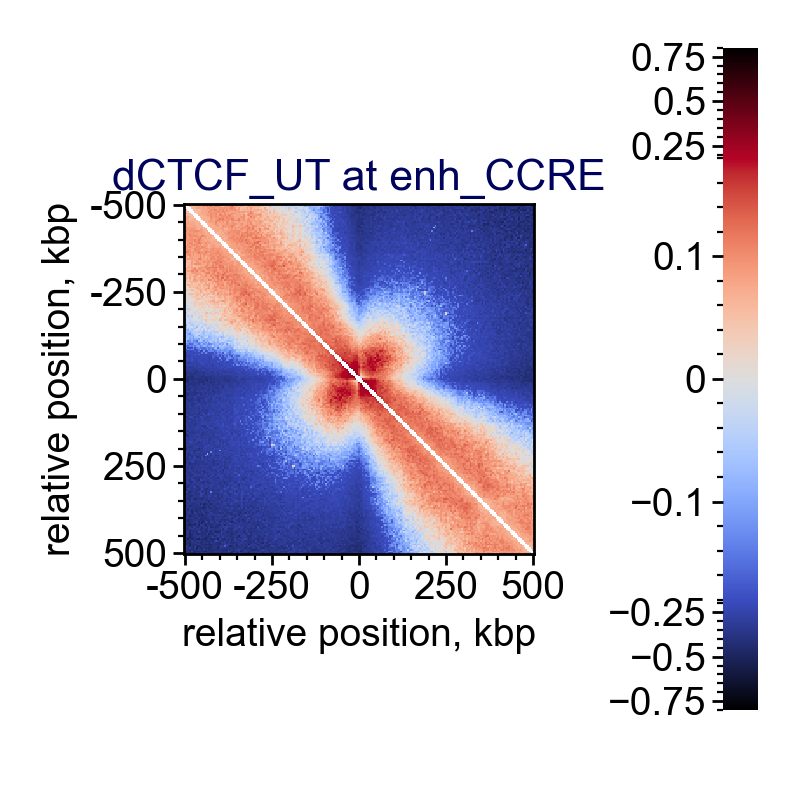

In [25]:
# Test plotting to show colorbar:
factor1 = 0.18
factor2 = 0.8

label = "dCTCF_UT"
feature = "enh_CCRE"
f = plot_heatmap_three_scales(
    np.log2(np.nanmean(dct_pileups[(feature, label)], axis=0)),
    vmin_scale2=-factor2,
    vmin_scale1=-factor1,
    vmax_scale1=factor1,
    vmax_scale2=factor2,
    flank=flank,
    resolution=binsize_mesc,
    interpolation="none",
    withlabels=True,
    cmap="coolwarm",
    cbar=True,
    log=False,
    title=f"{label} at {feature}",
)
f.tight_layout()

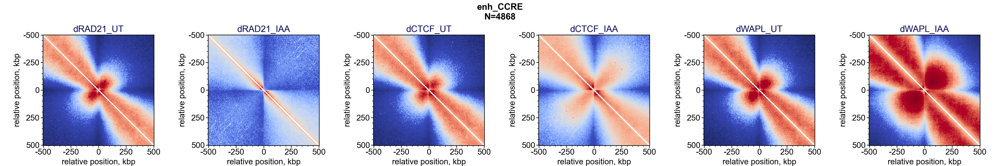

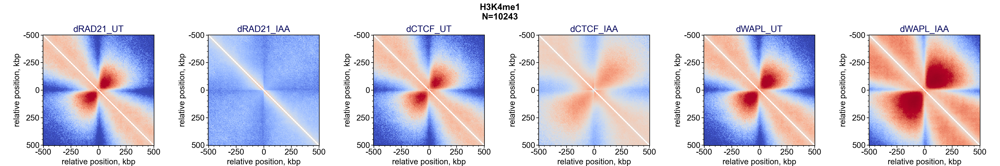

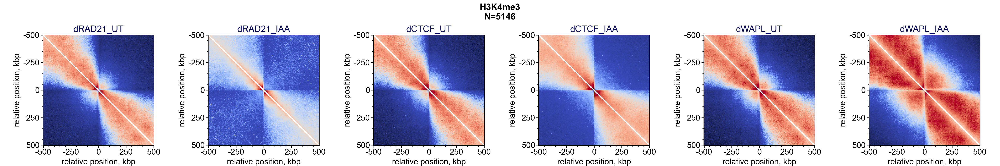

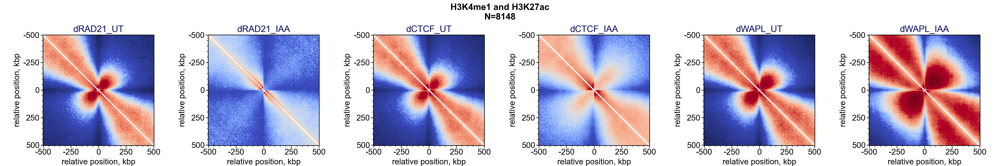

In [26]:
factor1 = 0.18
factor2 = 0.8

dct_hmaps = {}

for feature in features:
    fig, axes = plt.subplots(1, 6, figsize=[24, 4])
    for j, label in enumerate(clr_prefixes):
        ax = axes[j]
        hmap = np.log2(np.nanmean(dct_pileups[(feature, label)], axis=0))
        plot_heatmap_three_scales(
            hmap,
            vmin_scale2=-factor2,
            vmin_scale1=-factor1,
            vmax_scale1=factor1,
            vmax_scale2=factor2,
            flank=flank,
            resolution=binsize_mesc,
            interpolation="none",
            withlabels=True,
            cmap="coolwarm",
            cbar=False,
            log=False,
            ax_hmap=ax,
            fig=fig,
            title=label,
        )
        dct_hmaps[(feature, label)] = hmap.copy()

    fig.suptitle(f"{feature}\nN={len(dct_pileups[(feature, label)])}")
    fig.tight_layout()

    if do_save:
        prefix = f"{output_folder}/Fig6A-B.{feature}"
        fig.savefig(f"{prefix}.pdf")
        fig.savefig(f"{prefix}.png")

In [27]:
# Save the source data:
features_tosave = ["H3K4me1", "H3K4me3", "H3K4me1 and H3K27ac"]
cols_tosave = ["chrom", "start", "end", "distance_CTCF"]

if do_save:
    # Save the tables:
    for feature in features_tosave:
        output = dct_features[feature].copy()
        output = output[cols_tosave]
        prefix = f"{output_folder}/Fig6A-B.{feature}.regions"
        output.loc[:, "region_type"] = feature
        output = bioframe.sort_bedframe(output)

        output.to_csv(f"{prefix}.source.csv", index=False)

    # Save the heatmaps:
    for feature in features_tosave:
        for j, label in enumerate(clr_prefixes):
            hmap = dct_hmaps[(feature, label)].copy()
            prefix = f"{output_folder}/Fig6A-B.{feature}.{label}.hmap"
            output = pd.DataFrame(hmap)

            output.to_csv(f"{prefix}.source.csv", index=False)

    del output

del features_tosave, cols_tosave

In [28]:
section_flush()

✅ Section cleaned


## Pileups for G1E Hi-C on G1 exit (Fig. 6C-D)

In [29]:
section_start()

✅ Section started


### Load data

In [30]:
dct_files = {
    "Ana-Telo": "/net/levsha/share/lab/zhang2019/distiller-0.3.3_mm10/results/coolers_library_group/Hi_C_ana_telo.mm10.mapq_30.1000.mcool",
    "Early-G1": "/net/levsha/share/lab/zhang2019/distiller-0.3.3_mm10/results/coolers_library_group/Hi_C_early_G1.mm10.mapq_30.1000.mcool",
    "Late-G1": "/net/levsha/share/lab/zhang2019/distiller-0.3.3_mm10/results/coolers_library_group/Hi_C_late_G1.mm10.mapq_30.1000.mcool",
    "Mid-G1": "/net/levsha/share/lab/zhang2019/distiller-0.3.3_mm10/results/coolers_library_group/Hi_C_mid_G1.mm10.mapq_30.1000.mcool",
    "Prometa": "/net/levsha/share/lab/zhang2019/distiller-0.3.3_mm10/results/coolers_library_group/Hi_C_prometa.mm10.mapq_30.1000.mcool",
}
clr_prefixes = [
    "Prometa",
    "Ana-Telo",
    "Early-G1",
    "Mid-G1",
    "Late-G1",
]

#### Pre-calculate fountain score at 10 Kb and 200-Kb window half-size

Skip this step if you don't want to look at average structures at CCRE enhancers for mESCs.

In [31]:
binsize_mesc = 10_000

bins = cooler.binnify(chromsizes, binsize_mesc)
n_bins = len(bins)

window_size = 400_000
nproc = 15

In [32]:
# Load coolers and calculate expected (time-consuming step):
dct_coolers = {
    label: cooler.Cooler(dct_files[label] + f"::/resolutions/{binsize_mesc}")
    for label in clr_prefixes
}
dct_expected = {
    label: cooltools.expected_cis(
        dct_coolers[label], view_df=genomic_viewframe, nproc=nproc
    )
    for label in tqdm.tqdm(clr_prefixes)
}

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:27<00:00, 17.41s/it]


In [33]:
mask_fountain = np.load("/home/agalicina/IMMUNE/25_ondiagonal/masks/fountain_danio.npy")

In [35]:
# Retrieve the stacks if Hi-C/Micro-C data, calculate fountain score.
# We won't store the stacks b/c we just need 10 Kb for pre-calculation of the fountain score:
for label in clr_prefixes:
    clr = dct_coolers[label]
    expected = dct_expected[label]

    # Load observed-over-expected stackup (OOE):
    stack = cooltools.pileup(
        clr,
        bins,
        view_df=genomic_viewframe,
        expected_df=expected,
        flank=window_size // 2,
        nproc=nproc,
    )

    #### We do not store this data, it might simplify the calculations if you want to run this code repeatedly:
    ## if do_save:
    ##     np.save(f'{output_folder}/stackup.{label}.{binsize_mesc}.{window_size}.OOE.npy', stack)
    ## stack = np.load(f'{output_folder}/stackup.{label}.{binsize_mesc}.{window_size}.OOE.npy')

    # Calculate fountain similarity score to Danio rerio fountain:
    sim = fontanka.generate_similarity_score(stack, mask_fountain)
    bins.loc[:, f"FS_{label}"] = sim.copy()

    del stack, sim

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 272566/272566 [00:22<00:00, 11875.13it/s]


In [36]:
# Calculate insulation for retrieving important information about valid pixels.
# We use increased window size for calculation of valid pixels, because we'll plot larger window as a pileup laater:
window_size_valid = 250_000
df_ins_table = cooltools.api.insulation.calculate_insulation_score(
    dct_coolers["Ana-Telo"],
    window_bp=window_size_valid,
    view_df=genomic_viewframe,
    nproc=nproc,
)

In [37]:
bins = pd.merge(bins, df_ins_table, on=["chrom", "start", "end"])
bins.loc[:, "-FS_Ana-Telo"] = -bins.loc[:, "FS_Ana-Telo"]

In [38]:
# Here we apply peak calling from the insulation score cooltools module:
df_fount = cooltools.api.insulation.find_boundaries(
    bins,
    min_frac_valid_pixels=0.3,
    min_dist_bad_bin=0,
    log2_ins_key="-FS_Ana-Telo",
    n_valid_pixels_key=f"n_valid_pixels_{window_size_valid}",
    is_bad_bin_key="is_bad_bin",
)

df_fount = df_fount.rename({"boundary_strength": "fountain_strength"}, axis=1)

In [39]:
# Save potential fountains for the mESC in a file:
if do_save:
    df_fount.to_csv(f"{output_folder}/Fig6C-D.FS.table.G1E.csv")

### Load Hi-C data for the final pipeups
We use smaller bin size to make the fountain more visible.

In [40]:
binsize_mesc = 5_000

In [41]:
# Create a bin table:
bins = cooler.binnify(chromsizes, binsize_mesc)
n_bins = len(bins)

In [42]:
dct_coolers = {
    label: cooler.Cooler(dct_files[label] + f"::/resolutions/{binsize_mesc}")
    for label in clr_prefixes
}
dct_expected = {
    label: cooltools.expected_cis(
        dct_coolers[label], view_df=genomic_viewframe, nproc=nproc
    )
    for label in tqdm.tqdm(clr_prefixes)
}

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [01:48<00:00, 21.80s/it]


### Load epigenetics

In [43]:
# Load peaks of epigenetic marks:
df_27ac = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/GSE61349_g1ePool.H3K27ac.mm10-conv.broadpeak",
    schema="broadPeak",
)
df_me1 = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/G1E-ER4_H3K4me1_ChIP-Seq_ENCFF979KEL.bed",
    schema="bed",
)

# Load CTCF:
df_ctcf_1 = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/CTCF-asyn_REP1_peaks.narrowPeak",
    schema="narrowPeak",
)
df_ctcf_2 = bioframe.read_table(
    "/home/agalicina/DANIO/HIC/WD_2021_paper/15_Blobel/data/CTCF-asyn_REP2_peaks.narrowPeak",
    schema="narrowPeak",
)
df_ctcf = pd.concat([df_ctcf_1, df_ctcf_2])
df_ctcf_merged = bioframe.cluster(df_ctcf, min_dist=0).groupby("cluster").first()
df_ctcf_merged.loc[:, ["start", "end"]] = df_ctcf_merged.loc[
    :, ["cluster_start", "cluster_end"]
].values

In [44]:
def overlap_fountains(
    df1,
    df2=df_fount.dropna(subset=["fountain_strength"]),
    max_dist=10_000,
):
    cols = df1.columns
    df = bioframe.closest(df1[["chrom", "start", "end"]], df2, k=1)
    df = df.loc[df.distance <= max_dist, :]
    return df[["chrom", "start", "end"]]

In [45]:
# Potential enhancers as regions with both 27ac and me1:
df_enh = (
    bioframe.overlap(df_27ac, df_me1, how="left")
    .dropna(subset="chrom_")
    .drop_duplicates(subset=["chrom", "start", "end"])
)
print(len(df_enh))

# Filter out those potential enhancers that have fountain score peak:
df_enh = overlap_fountains(
    df_enh, df_fount.dropna(subset=["fountain_strength"]), max_dist=binsize_mesc
).reset_index(drop=True)
print(len(df_enh))

# Fountain score of the overlapping fountain:
df_enh = bioframe.closest(
    df_enh, df_fount.dropna(subset=["fountain_strength"]), k=1, suffixes=("", "_FS")
).rename({"distance": "distance_FS"}, axis=1)

# Calculate distance to CTCF:
df_enh = bioframe.closest(df_enh, df_ctcf_merged, suffixes=("", "_CTCF")).rename(
    {"distance": "distance_CTCF"}, axis=1
)

# Sample those enhancers that are too close to each other:
df_enh = (
    bioframe.cluster(df_enh, min_dist=2 * binsize_mesc)
    .sample(frac=1)
    .reset_index(drop=True)
    .groupby("cluster")
    .first()
)
len(df_enh)

21147
7779


5671

In [46]:
dct_features = {
    "enh": df_enh,
    "enh_no_ctcf_10K": df_enh.query("distance_CTCF>10000")
    .sort_values("FS_Ana-Telo_FS", ascending=False)
    .reset_index(drop=True),
}
features = dct_features.keys()

### Load pileups

In [47]:
dct_pileups = {}
flank = 500_000
nproc = 15
for feature in features:
    for condition in tqdm.tqdm(clr_prefixes):

        if (feature, condition) in dct_pileups.keys():
            continue

        clr = dct_coolers[condition]
        df_feature = dct_features[feature]
        mtx = cooltools.pileup(
            clr,
            features_df=df_feature[["chrom", "start", "end"]],
            view_df=genomic_viewframe,
            expected_df=dct_expected[condition],
            flank=flank,
            nproc=nproc,
        )
        dct_pileups[(feature, condition)] = mtx.copy()

del condition, feature, mtx, df_feature

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:38<00:00,  7.61s/it]


In [48]:
dct_pileups_200K = {}
flank = 200_000
nproc = 15
for feature in features:
    for condition in tqdm.tqdm(clr_prefixes):

        if (feature, condition) in dct_pileups_200K.keys():
            continue

        clr = dct_coolers[condition]
        df_feature = dct_features[feature]
        mtx = cooltools.pileup(
            clr,
            features_df=df_feature[["chrom", "start", "end"]],
            view_df=genomic_viewframe,
            expected_df=dct_expected[condition],
            flank=flank,
            nproc=nproc,
        )
        dct_pileups_200K[(feature, condition)] = mtx.copy()

del condition, feature, mtx, df_feature

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:34<00:00,  7.00s/it]


#### Get the raw maps for Ana/Telo only, for display as an example:

In [108]:
binsize_raw = 10_000
flank_raw = 750_000

dct_coolers_raw = {
    label: cooler.Cooler(dct_files[label] + f"::/resolutions/{binsize_raw}")
    for label in clr_prefixes
}

nproc = 15

In [109]:
# Get the raw map for Ana/Telo only:
dct_pileups_raw = {}
for feature in features:
    for label in ["Ana-Telo"]:
        clr = dct_coolers_raw[label]
        df_feature = dct_features[feature]

        stack_raw = cooltools.pileup(
            clr, df_feature, view_df=genomic_viewframe, flank=flank_raw, nproc=nproc
        )

        dct_pileups_raw[(feature, label)] = stack_raw.copy()

        del clr, stack_raw

### Plot pileups (Fig. 6C)

Creating new figure...


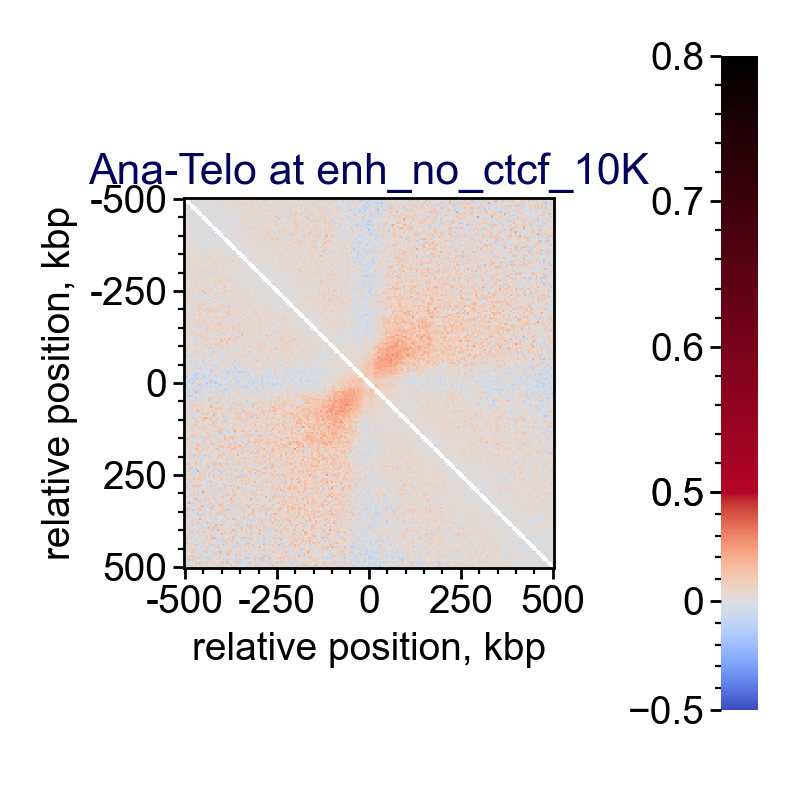

In [49]:
# Test plotting to show colorbar:
factor1 = 0.5
factor2 = 0.8
flank = 500_000

label = "Ana-Telo"
feature = "enh_no_ctcf_10K"
f = plot_heatmap(
    np.log2(np.nanmean(dct_pileups[(feature, label)], axis=0)),
    vmin=-factor1,
    vmax_scale1=factor1,
    vmax_scale2=factor2,
    flank=flank,
    resolution=binsize_mesc,
    interpolation="none",
    withlabels=True,
    cmap="coolwarm",
    cbar=True,
    log=False,
    title=f"{label} at {feature}",
)
f.tight_layout()

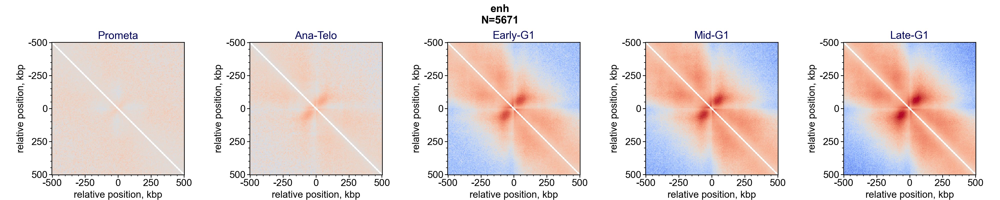

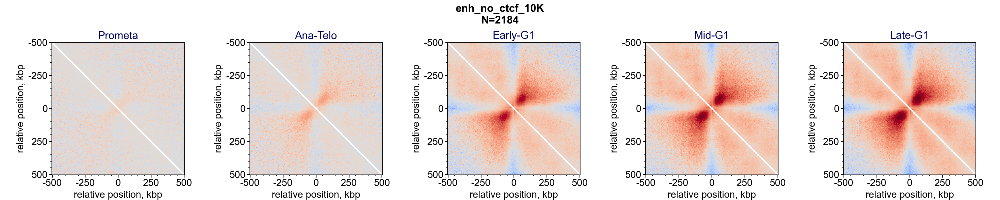

In [50]:
factor1 = 0.5
factor2 = 0.8

dct_hmaps = {}
flank = 500_000

for feature in features:
    fig, axes = plt.subplots(1, 5, figsize=[20, 4])
    for j, label in enumerate(clr_prefixes):
        ax = axes[j]
        hmap = np.log2(np.nanmean(dct_pileups[(feature, label)], axis=0))
        plot_heatmap(
            hmap,
            # vmin_scale2=-factor2,
            vmin=-factor1,
            vmax_scale1=factor1,
            vmax_scale2=factor2,
            flank=flank,
            resolution=binsize_mesc,
            interpolation="none",
            withlabels=True,
            cmap="coolwarm",
            cbar=False,
            log=False,
            ax_hmap=ax,
            fig=fig,
            title=label,
        )
        dct_hmaps[(feature, label)] = hmap.copy()

    fig.suptitle(f"{feature}\nN={len(dct_pileups[(feature, label)])}")
    fig.tight_layout()

    if do_save:
        prefix = f"{output_folder}/Fig6C.{feature}"
        fig.savefig(f"{prefix}.pdf")
        fig.savefig(f"{prefix}.png")

In [51]:
# Save the source data:
features_tosave = ["enh_no_ctcf_10K"]
cols_tosave = ["chrom", "start", "end", "distance_CTCF"]

if do_save:
    # Save the tables:
    for feature in features_tosave:
        output = dct_features[feature].copy()
        output = output[cols_tosave]
        prefix = f"{output_folder}/Fig6C.{feature}.regions"
        output.loc[:, "region_type"] = feature
        output = bioframe.sort_bedframe(output)

        output.to_csv(f"{prefix}.source.csv", index=False)

    # Save the heatmaps:
    for feature in features_tosave:
        for j, label in enumerate(clr_prefixes):
            hmap = dct_hmaps[(feature, label)].copy()
            prefix = f"{output_folder}/Fig6C.{feature}.{label}.hmap"
            output = pd.DataFrame(hmap)

            output.to_csv(f"{prefix}.source.csv", index=False)

    del output

del features_tosave, cols_tosave

### Plot individual examples (Fig. 6D)

chr12:86858650-86860850
chr9:41115517-41125517
chr5:96904981-96945581
chr11:88124898-88136298
chr5:135684130-135687130
chr4:134651285-134655485
chr9:48753695-48757695
chr2:131902864-131918264
chr2:6339754-6345954
chr3:153770636-153777436


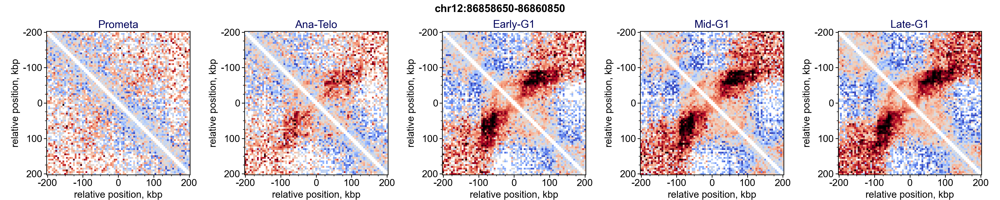

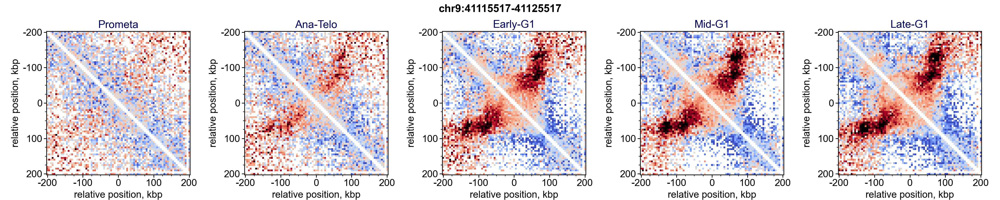

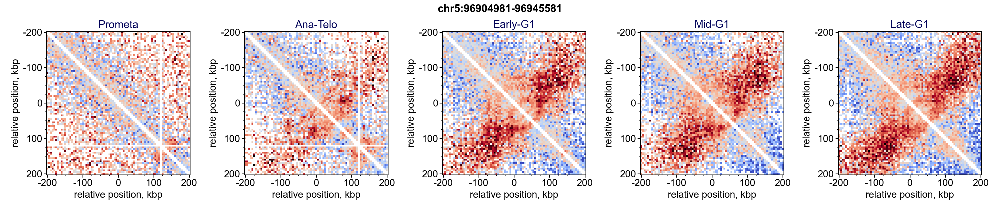

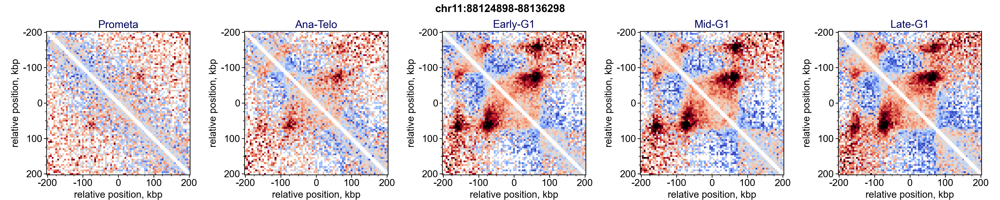

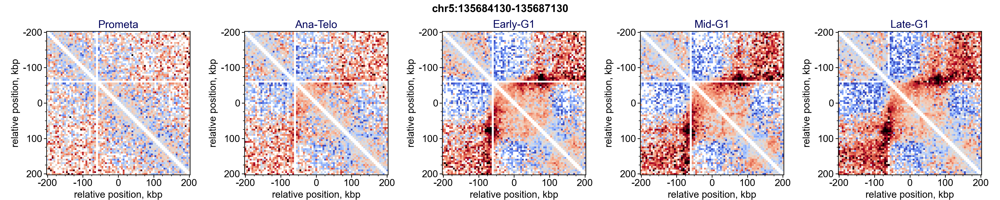

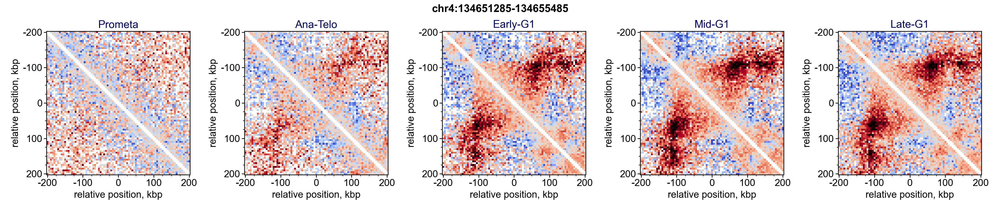

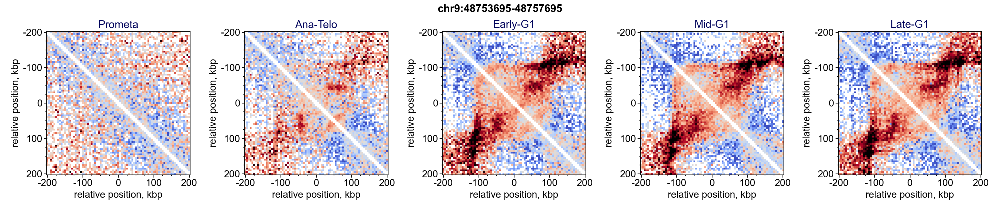

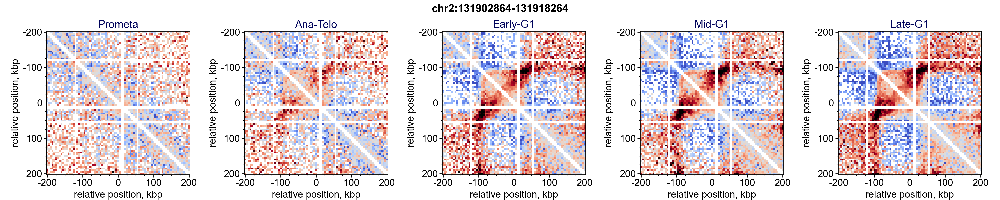

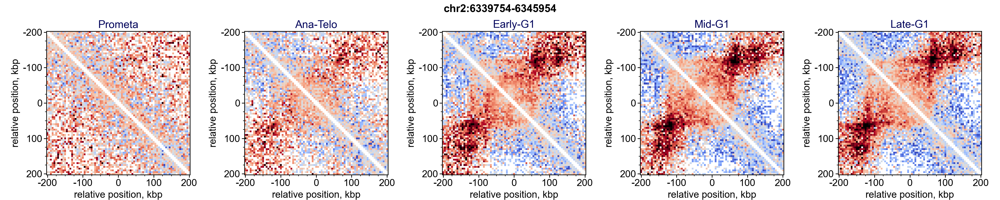

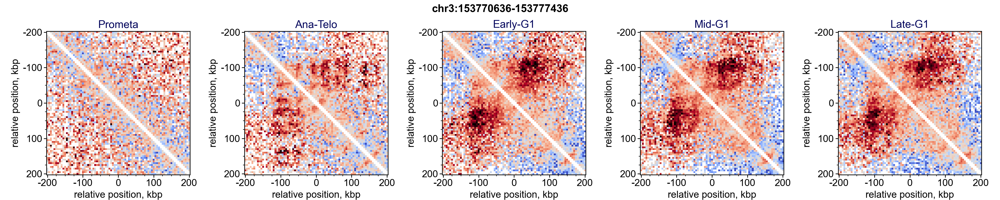

In [52]:
factor1 = 2
factor2 = 3

dct_hmaps = {}
feature = "enh_no_ctcf_10K"
flank = 200_000

for i in range(10):

    fig, axes = plt.subplots(1, 5, figsize=[20, 4])

    idx = dct_features[feature].index
    chrom, start, end = (
        dct_features[feature].loc[idx[i], ["chrom", "start", "end"]].values
    )
    title = f"{chrom}:{start}-{end}"
    print(title)

    for j, label in enumerate(clr_prefixes):
        ax = axes[j]
        hmap = np.log2(dct_pileups_200K[(feature, label)][i])

        plot_heatmap(
            hmap,
            # vmin_scale2=-factor2,
            vmin=-factor1,
            vmax_scale1=factor1,
            vmax_scale2=factor2,
            flank=flank,
            resolution=binsize_mesc,
            interpolation="none",
            withlabels=True,
            cmap="coolwarm",
            cbar=False,
            log=False,
            ax_hmap=ax,
            fig=fig,
            title=label,
        )
        dct_hmaps[(feature, label)] = hmap.copy()

    fig.suptitle(f"{title}")
    fig.tight_layout()

    if do_save:
        prefix = f"{output_folder}/Fig6D.region-{i}.{title}"
        fig.savefig(f"{prefix}.pdf")
        fig.savefig(f"{prefix}.png")

#### Plot raw maps

In [95]:
# Import "fall" colormap:
from cooltools.lib import plotting

chr12:86858650-86860850
Creating new figure...
chr9:41115517-41125517
Creating new figure...
chr5:96904981-96945581
Creating new figure...


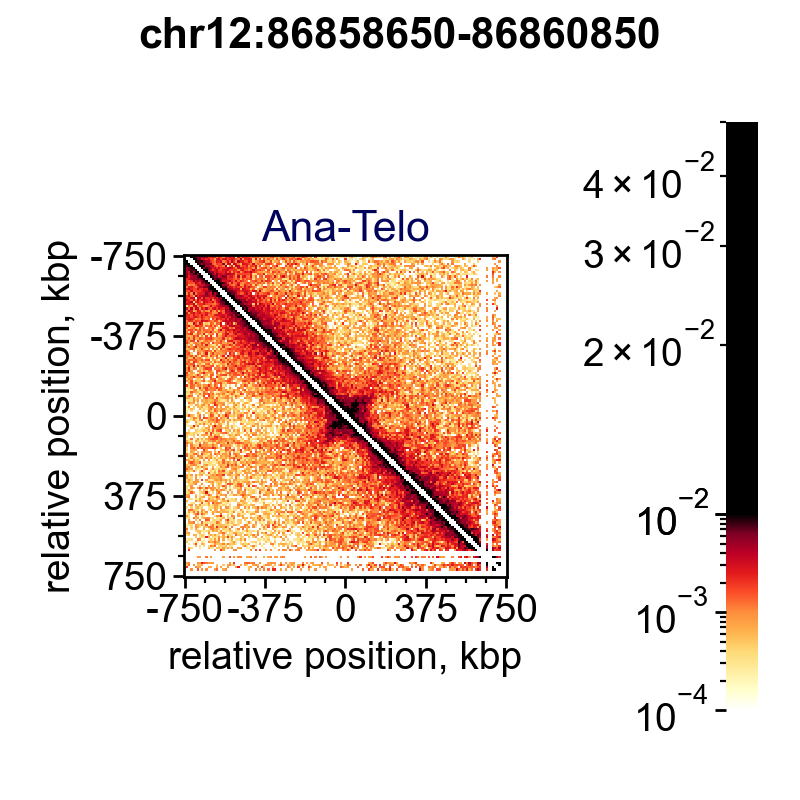

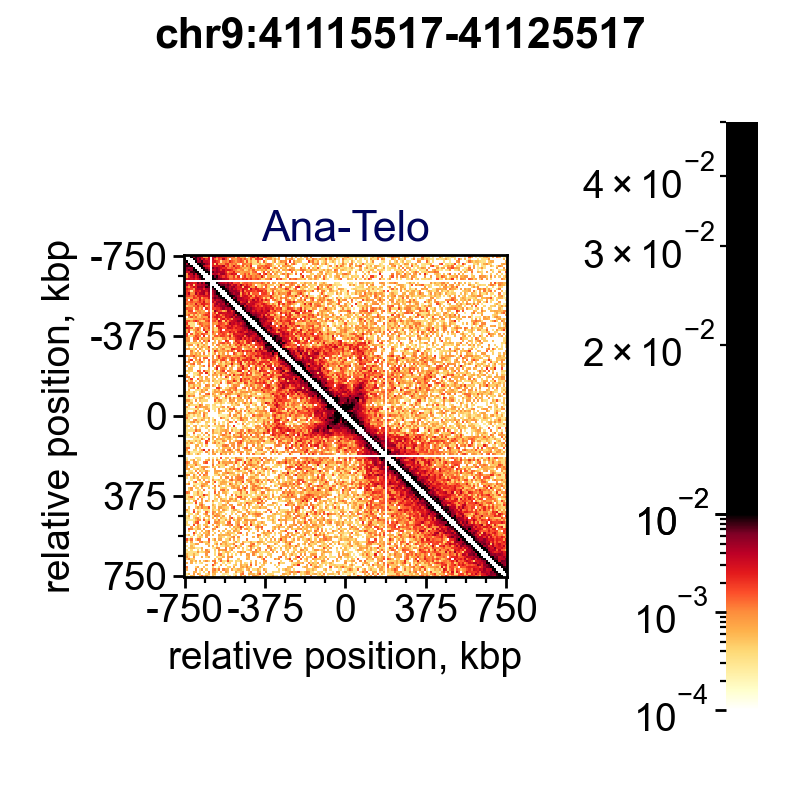

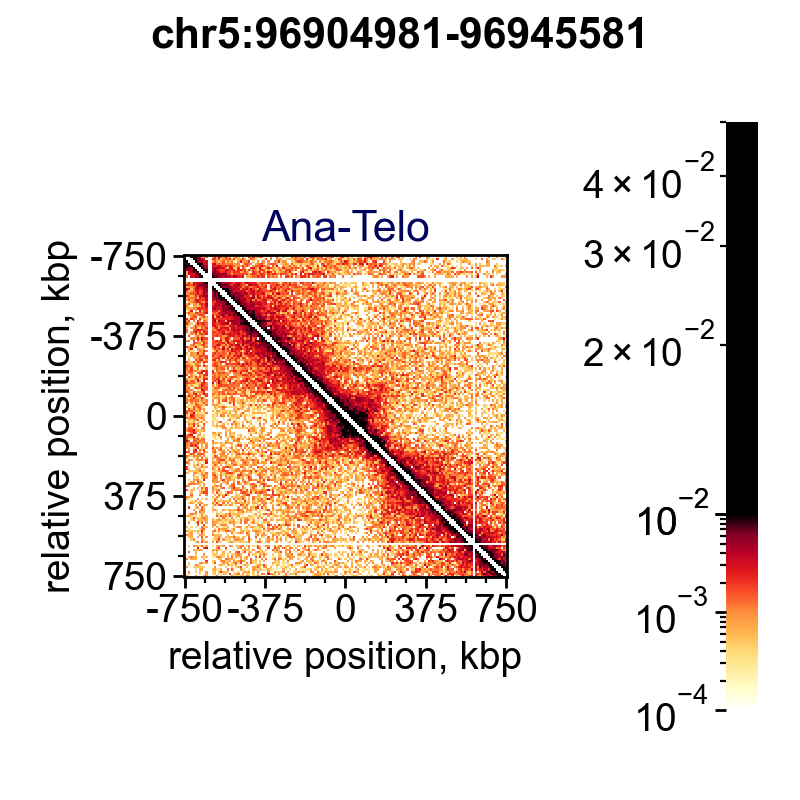

In [110]:
dct_hmaps = {}
feature = "enh_no_ctcf_10K"
flank_raw = 750_000
binsize_raw = 10_000

for i in range(3):

    idx = dct_features[feature].index
    chrom, start, end = (
        dct_features[feature].loc[idx[i], ["chrom", "start", "end"]].values
    )
    title = f"{chrom}:{start}-{end}"
    print(title)

    label = "Ana-Telo"

    hmap = dct_pileups_raw[(feature, label)][i]

    fig = plot_heatmap(
        hmap,
        vmin=1e-4,
        vmax_scale1=0.01,
        vmax_scale2=0.05,
        flank=flank_raw,
        resolution=binsize_raw,
        interpolation="none",
        withlabels=True,
        cmap="fall",
        cbar=True,
        log=True,
        # ax_hmap=ax,
        # fig=fig,
        title=label,
    )

    dct_hmaps[(feature, label)] = hmap.copy()

    fig.suptitle(f"{title}")
    fig.tight_layout()

    if do_save:
        prefix = f"{output_folder}/Fig6D.region-{i}.500Kb.{title}"
        fig.savefig(f"{prefix}.pdf")
        fig.savefig(f"{prefix}.png")

In [ ]:
section_flush()